<center>
<h1>Simple Linear Regression</h1>
<h2>Longhai Li</h2>
September 2025
</center>

In [1]:
require("knitr")

knitr::opts_chunk$set(
    comment = "#",
    fig.width=8, 
    fig.height=6, 
    cache = TRUE
)

Loading required package: knitr



In [ ]:
#install.packages ("animation")

In [ ]:
#install.packages ("animation")

In [ ]:
#install.packages ("latex2exp")


In [2]:
require ("latex2exp")
require ("animation")

Loading required package: latex2exp

Loading required package: animation

Warning message in library(package, lib.loc = lib.loc, character.only = TRUE, logical.return = TRUE, :
“there is no package called ‘animation’”


# Example 1: Vehicle Insurance Premium

## Input data

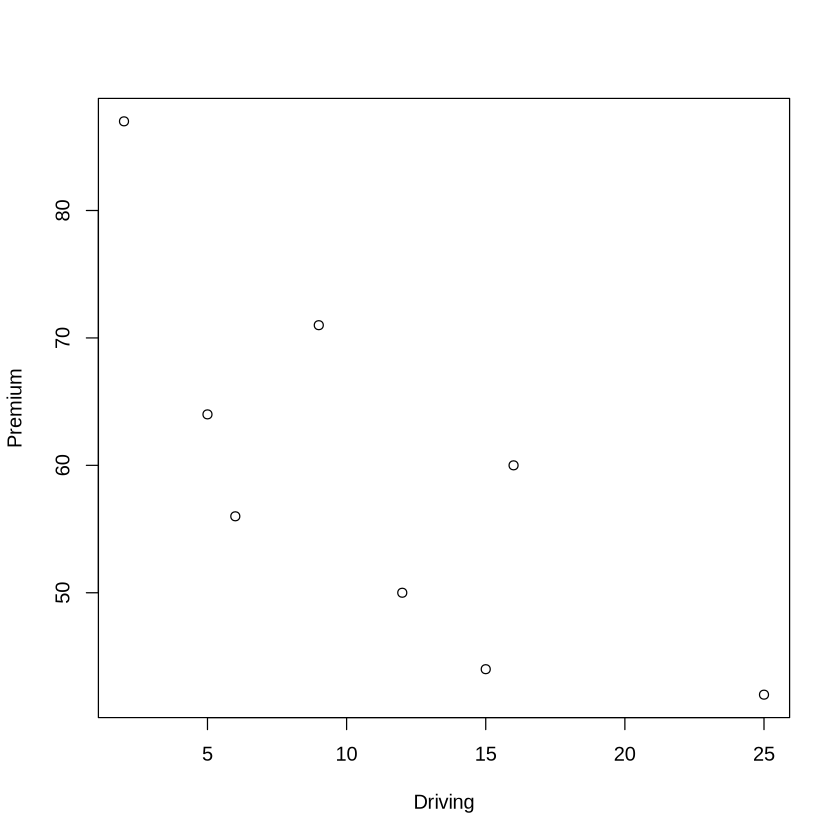

In [3]:
issu <- data.frame (
    driving = c(5, 2, 12, 9, 15, 6, 25, 16),
    premium = c(64, 87, 50, 71, 44, 56, 42, 60)
)

y <- issu$premium
x <- issu$driving
xbar <- mean(x)
ybar <- mean(y)
n <- length(y)
plot(x,y, xlab = "Driving", ylab = "Premium")

## Estimating regression coefficients

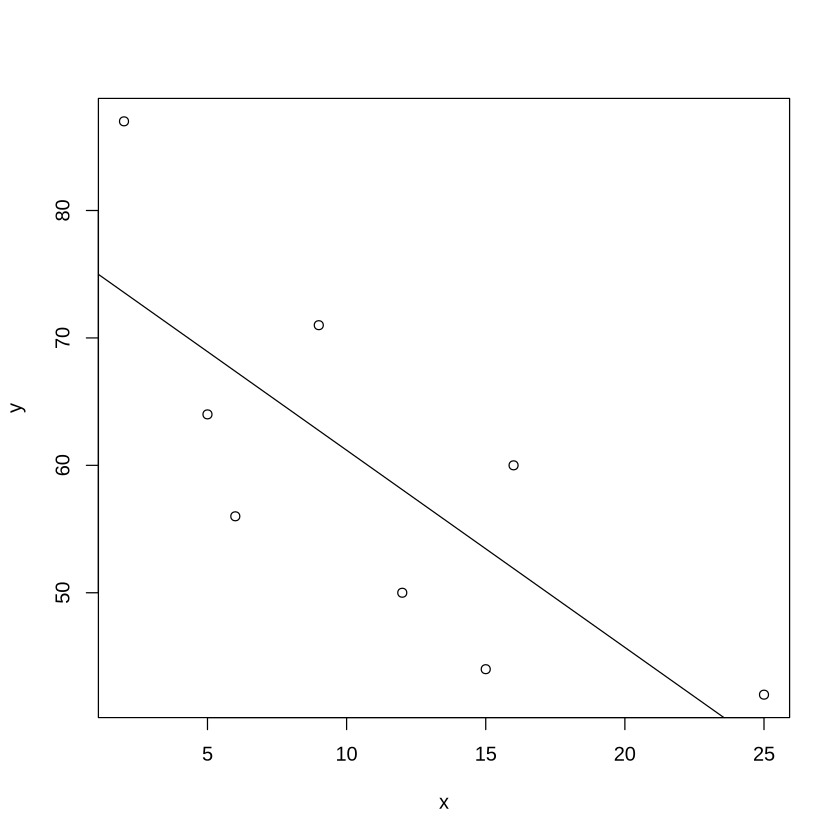

In [4]:
fit.issu <- lm(y~x)
plot(x,y)
abline (fit.issu)

## Sum Squares of Residuals

In [5]:
beta0 <- fit.issu$coefficients[1]
beta1 <- fit.issu$coefficients[2]
fitted1 <- beta0+beta1*x
fitted0 <- rep(ybar, n)
residual1 <- y - fitted1
residual0 <- y - fitted0

data.frame (y, fitted0, residual0, fitted1, residual1, diff.residual=fitted1-fitted0)

y,fitted0,residual0,fitted1,residual1,diff.residual
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
64,59.25,4.75,68.92243,-4.922425,9.672425
87,59.25,27.75,73.56519,13.434811,14.315189
50,59.25,-9.25,58.08931,-8.089309,-1.160691
71,59.25,11.75,62.73207,8.267927,3.482073
44,59.25,-15.25,53.44654,-9.446545,-5.803455
56,59.25,-3.25,67.37484,-11.374837,8.124837
42,59.25,-17.25,37.97066,4.029335,-21.279335
60,59.25,0.75,51.89896,8.101043,-7.351043


<b>Visualize the fitted line, fitted values, and residuals</b>

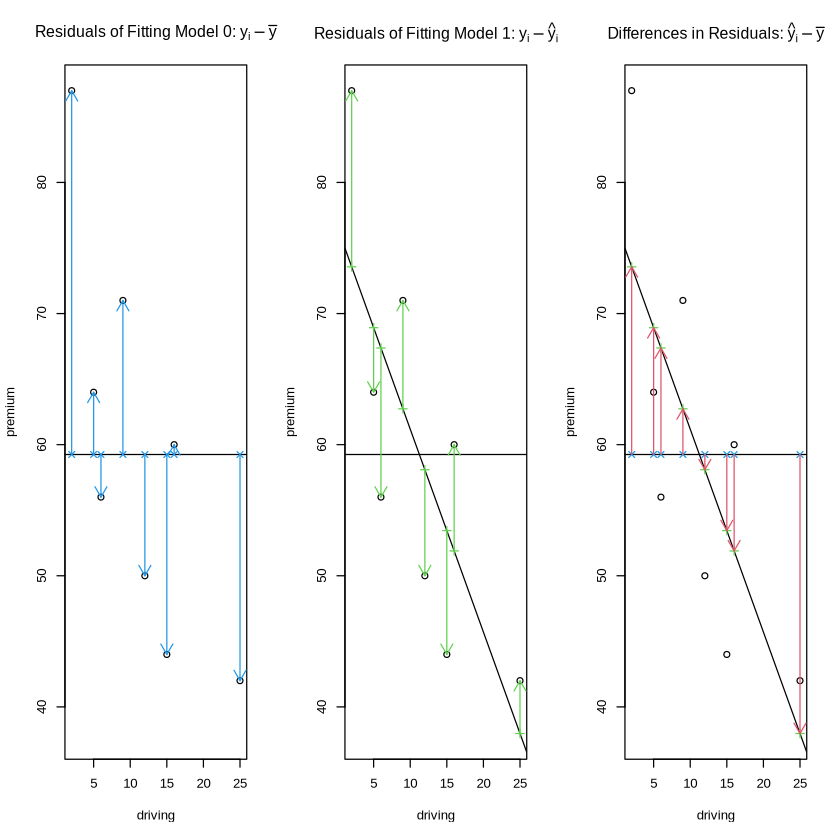

In [6]:
par (mfrow = c(1,3))
plot (premium ~ driving, data = issu, ylim = range(y, fitted1, fitted0))
abline (h=mean(y))
points(x, fitted0, pch = 4,col=4)
for (i in 1: length(y)){
    arrows( x[i],fitted0[i],x[i], y[i], length=0.1, col = 4)
}
title(main= TeX("Residuals of Fitting Model 0: $y_i-\\bar{y}$"))


plot (premium ~ driving, data = issu, ylim = range(y, fitted1, fitted0))
abline (h=mean(y))
abline(a=beta0, b=beta1)
points(x, fitted1, pch = 3,col=3)
for (i in 1: length(y)){
    arrows( x[i],fitted1[i],x[i], y[i], length=0.1, col = 3)
    
}
title(main= TeX("Residuals of Fitting Model 1: $y_i-\\hat{y}_i$"))


plot (premium ~ driving, data = issu, ylim = range(y, fitted1, fitted0))
abline (h=mean(y))
abline(a=beta0, b=beta1)
points(x, fitted0, pch = 4,col=4)
points(x, fitted1, pch = 3,col=3)

for (i in 1: length(y)){
    arrows( x[i],fitted0[i],x[i], fitted1[i], length=0.1, col = 2)
    
}
title(main= TeX("Differences in Residuals: $\\hat{y}_i-\\bar{y}$"))


**Definitions of SSR, SSE, SST**:

In [7]:
SST <- sum((y-fitted0)^2); SST
SSE <- sum ((y-fitted1)^2);SSE
SSR <- SST-SSE;SSR


[1] 1557.5

[1] 639.0065

[1] 918.4935

SSR can be computed directly with

In [8]:
sum((fitted1-fitted0)^2)

[1] 918.4935

**Plot of Residual Sum Squares**


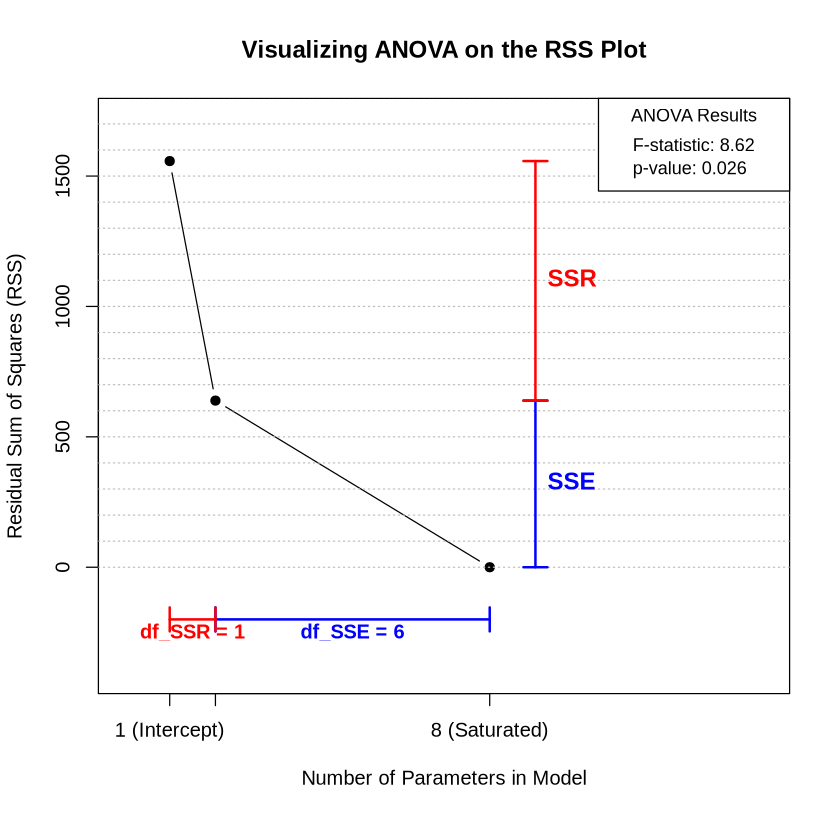

In [9]:
# --- Assumed Setup Code (from your previous file) ---
# This data and model fit are needed for the calculations
# --- Assumed Setup Code (from your previous file) ---
# This data and model fit are needed for the calculations
issu <- data.frame (
    driving = c(5, 2, 12, 9, 15, 6, 25, 16),
    premium = c(64, 87, 50, 71, 44, 56, 42, 60)
)
y <- issu$premium
x <- issu$driving
n <- length(y)
fit.issu <- lm(y~x)
# --- End of Setup ---


# --- Calculations for ANOVA components ---
SST <- sum((y - mean(y))^2)
SSE <- sum(resid(fit.issu)^2)
SSR <- SST - SSE
df_SSR <- 1 # For simple linear regression (change from 1 to 2 parameters)
df_SSE <- n - 2


# --- Create the Plot ---
# Set plot margins to make extra space at the bottom for the df segments
par(mar = c(6, 4, 4, 2) + 0.1)

# Create the main plot, expanding x-axis to 14
plot(c(1, 2, n), c(SST, SSE, 0), type="b", pch = 19,
     xlab = "Number of Parameters in Model",
     ylab = "Residual Sum of Squares (RSS)",
     main = "Visualizing ANOVA on the RSS Plot",
     xlim = c(0, 14), # Expanded x-axis limit
     ylim = c(-400, SST * 1.1), # Extend y-axis below 0
     xaxt = "n" # Turn off default x-axis to draw a custom one
     )
axis(1, at = c(1, 2, n), labels = c("1 (Intercept)", "2 (+ Slope)", paste(n, "(Saturated)")))
abline(h=seq(0, 2000, by=100), lty=3, col="grey")


# --- Allow drawing outside the main plot area ---
par(xpd=TRUE)

# --- Draw Repositioned Segments ---
# 1. Show SSE (blue) - at x=9
arrows(x0 = 9, y0 = 0, x1 = 9, y1 = SSE, col = "blue", code = 3, angle = 90, length = 0.1, lwd = 2)
text(x = 9, y = SSE / 2, "SSE", col = "blue", pos = 4, font = 2, cex = 1.2)

# 2. Show SSR (red) - at x=9
arrows(x0 = 9, y0 = SSE, x1 = 9, y1 = SST, col = "red", code = 3, angle = 90, length = 0.1, lwd = 2)
text(x = 9, y = (SST + SSE) / 2, "SSR", col = "red", pos = 4, font = 2, cex = 1.2)

# 3. Show df_SSE (blue) - below y=0
arrows(x0 = 2, y0 = -200, x1 = n, y1 = -200, col = "blue", code = 3, angle = 90, length = 0.1, lwd = 2)
text(x = (2 + n) / 2, y = -250, paste("df_SSE =", df_SSE), col = "blue", font = 2)

# 4. Show df_SSR (red) - below y=0
arrows(x0 = 1, y0 = -200, x1 = 2, y1 = -200, col = "red", code = 3, angle = 90, length = 0.1, lwd = 2)
text(x = 1.5, y = -250, paste("df_SSR =", df_SSR), col = "red", font = 2)


# --- NEW CODE: Add ANOVA F and p-value to top-right corner ---
# 1. Calculate the F-statistic and p-value
f_value <- (SSR/df_SSR) / (SSE/df_SSE)
p_value <- pf(f_value, df1=df_SSR, df2=df_SSE, lower.tail = FALSE)

# 2. Format the text strings for display
f_stat_text <- sprintf("F-statistic: %.2f", f_value)
p_val_text  <- sprintf("p-value: %.3f", p_value)

# 3. Use legend() to create an info box on the plot
legend(
  "topright", # Position of the box
  legend = c(f_stat_text, p_val_text),
  title = "ANOVA Results",
  bty = "o",  # Draw a box around the legend
  cex = 0.9   # Adjust character size
)

# Reset clipping to default for any subsequent plots
par(xpd=FALSE)

**Coefficient of Determination: $R^2$**

In [10]:
R2 <- SSR/SST; R2

[1] 0.5897229

**Mean Sum Squares and F statististic**

In [11]:
f <- (SSR/1)/(SSE/(n-2)); f

[1] 8.624264

p-value to assess whether the relationship exists (statistical significance measure)

In [12]:
pvf <- pf(f, df1=1, df2=n-2, lower.tail = FALSE); pvf

[1] 0.0260588

**ANOVA table**

In [13]:
Ftable <- data.frame(df = c(1,n-2), SS=c(SSR,SSE), 
                     MSS = c(SSR/1, SSE/(n-2)), Fstat=c(f,NA),
                     p.value = c(pvf, NA),
                     R2 = c(SSR, SSE)/SST)
Ftable

df,SS,MSS,Fstat,p.value,R2
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,918.4935,918.4935,8.624264,0.0260588,0.5897229
6,639.0065,106.5011,NA,NA,0.4102771


## A single function to produce ANOVA table

In [14]:
fit.issu <- lm(y~x)
anova(fit.issu)

,Df,Sum Sq,Mean Sq,F value,Pr(>F)
,<int>,<dbl>,<dbl>,<dbl>,<dbl>
x,1,918.4935,918.4935,8.624264,0.0260588
Residuals,6,639.0065,106.5011,NA,NA


## Animation for Understanding the Sampling Distributions of SS and F

### When the slope is 0 ($H_0$ is true)

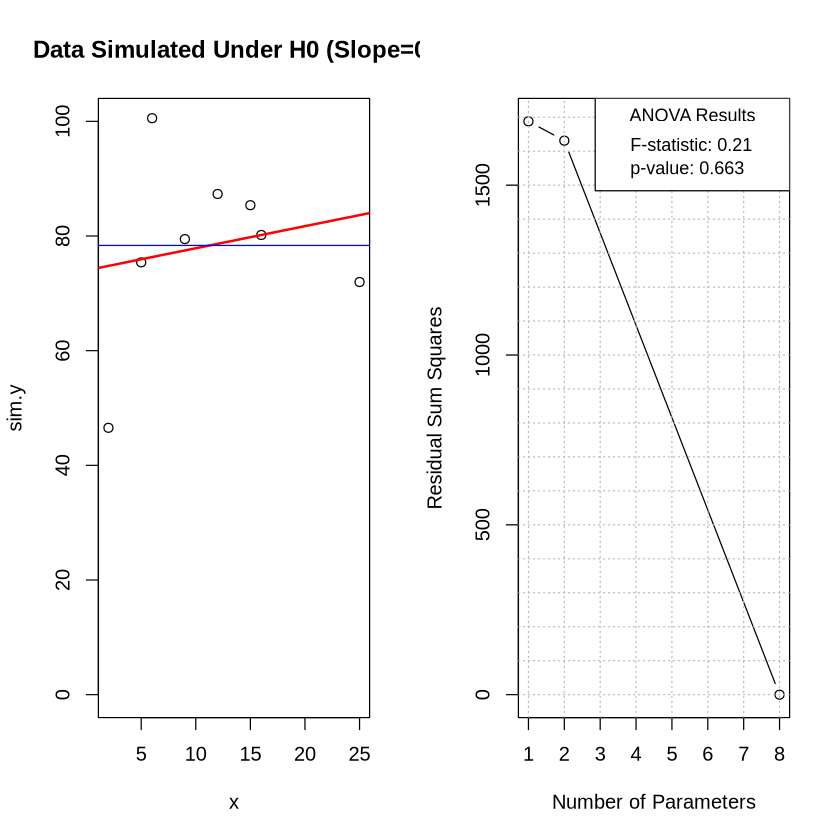

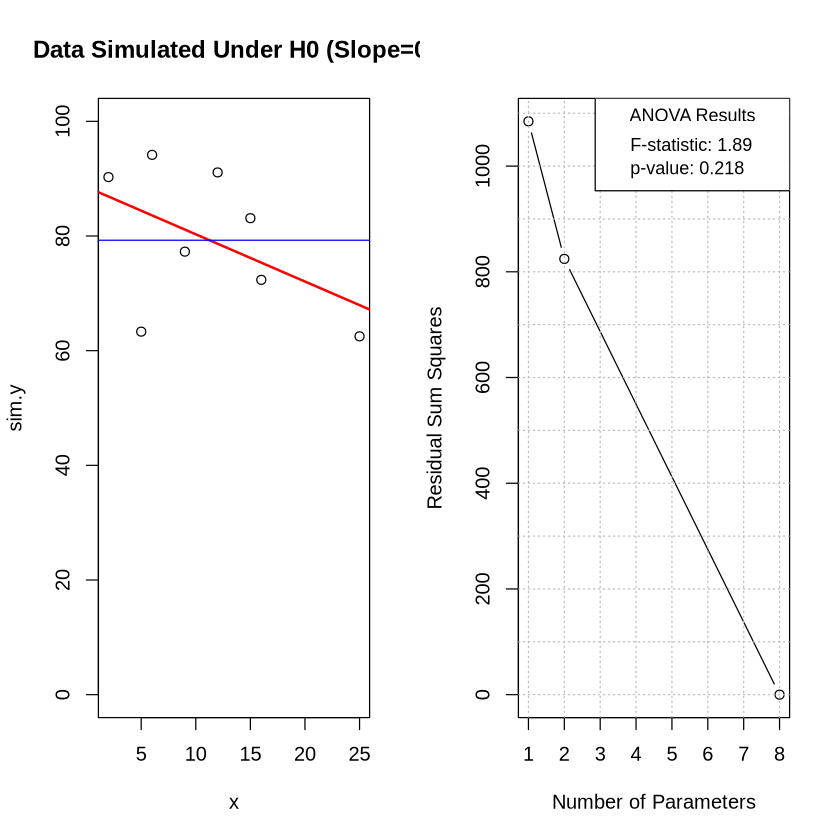

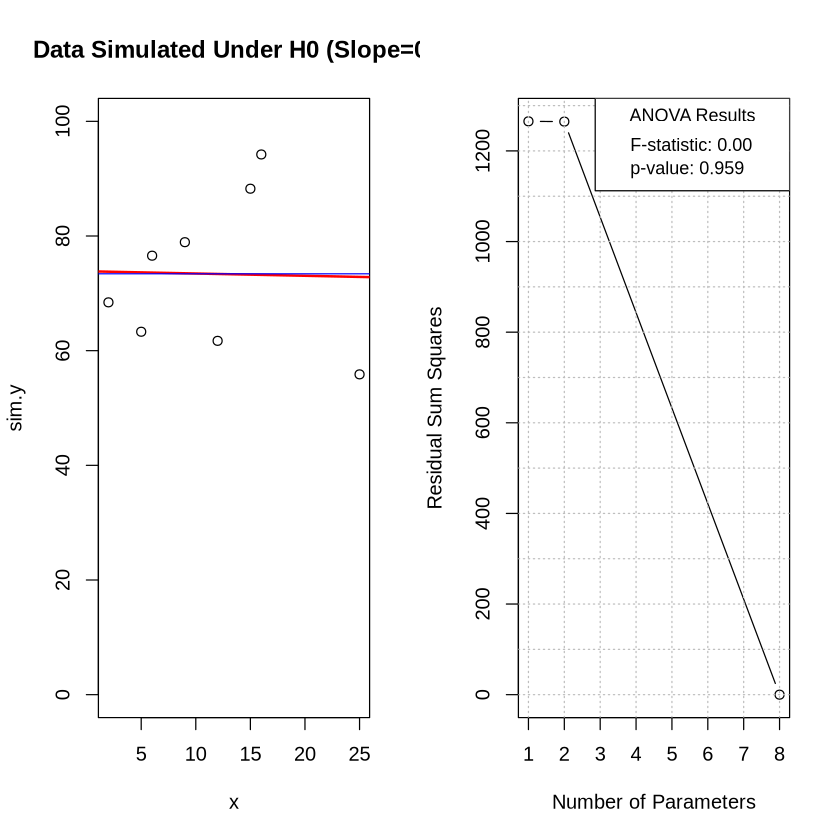

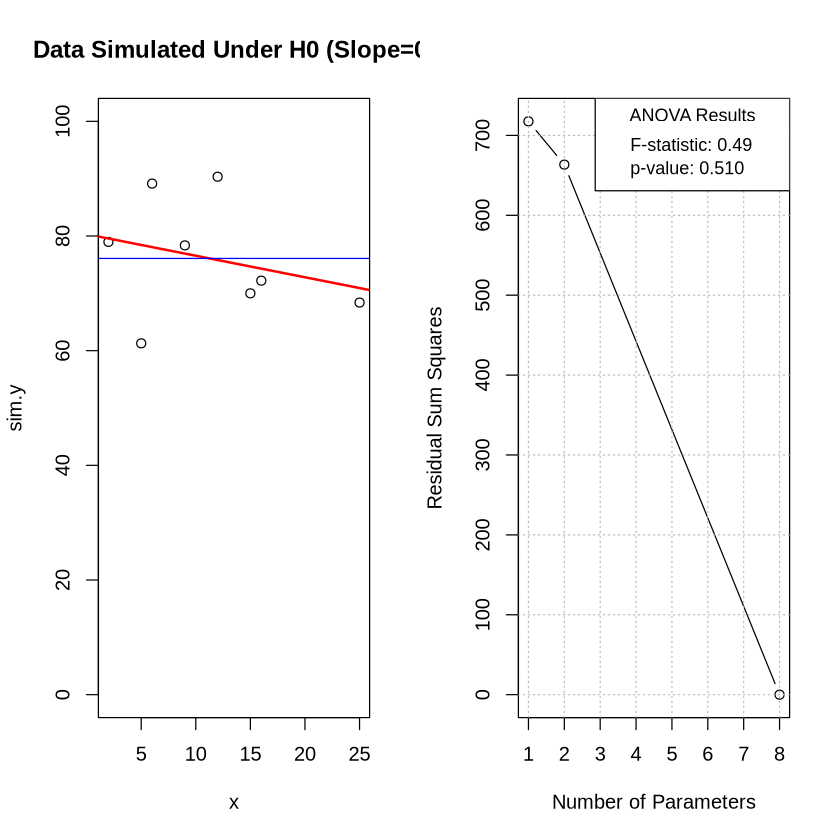

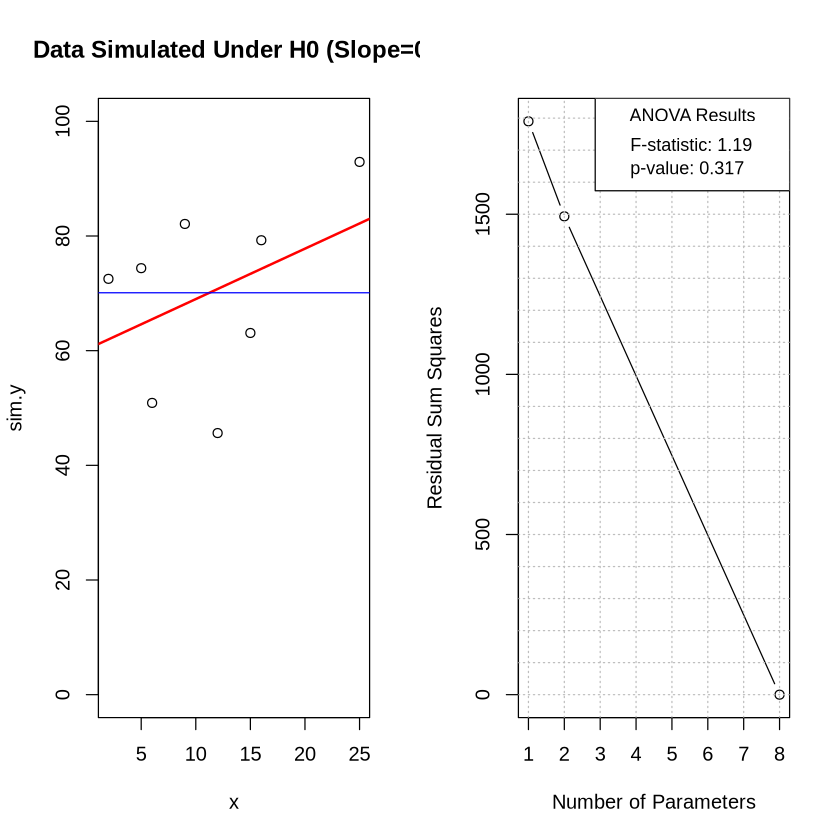

...

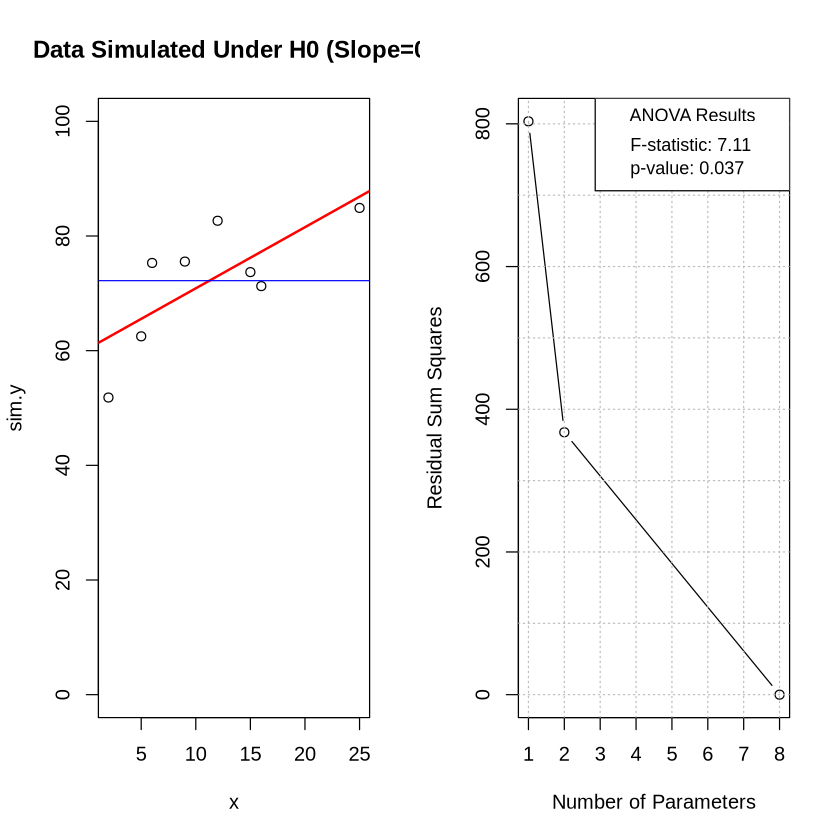

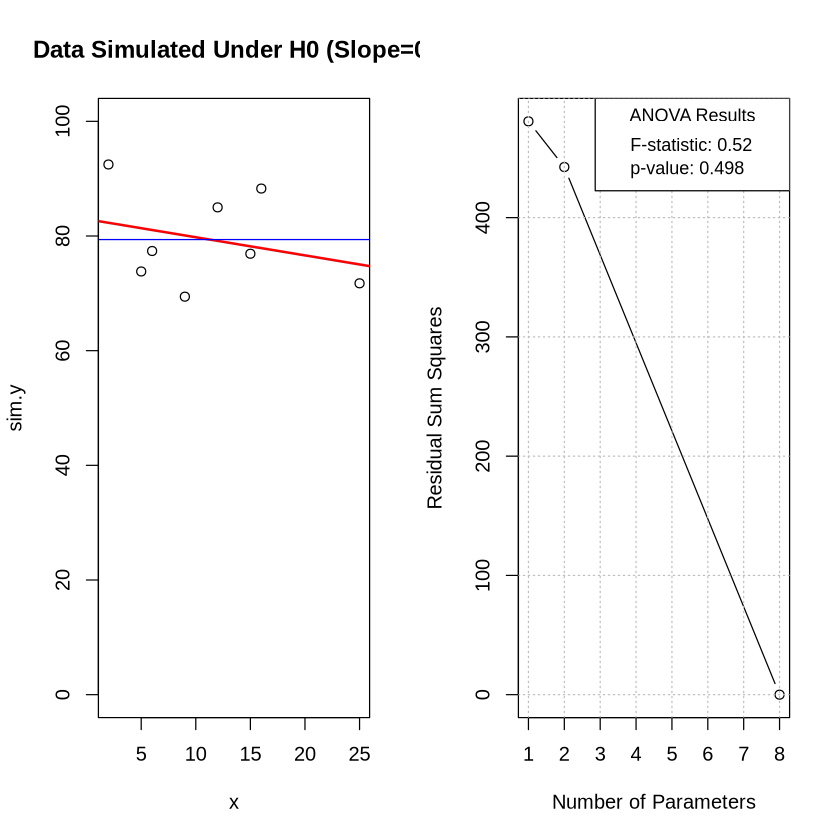

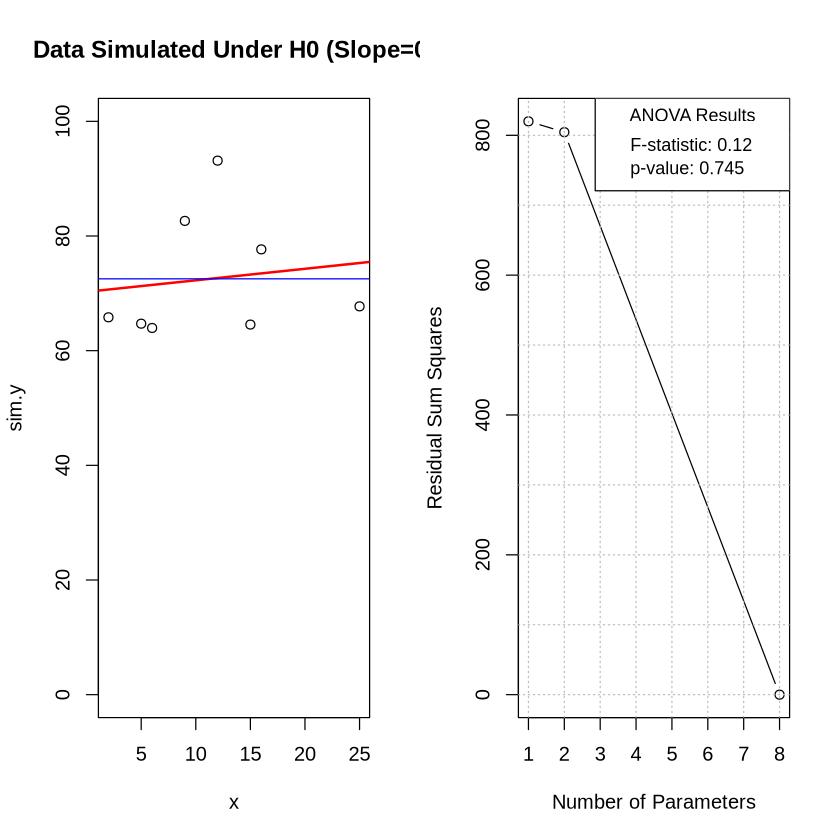

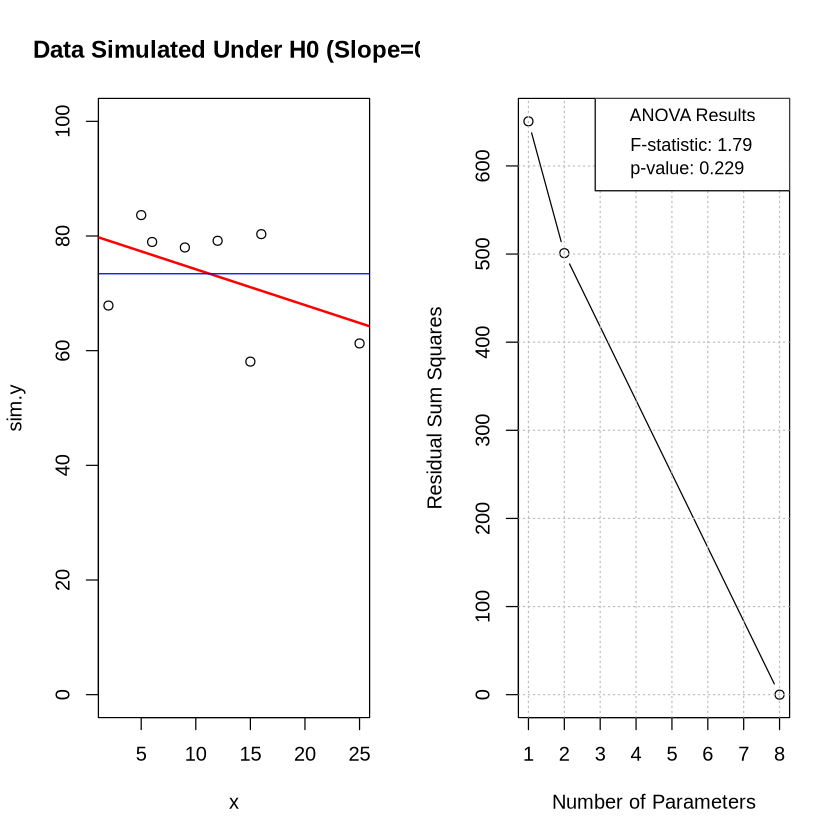

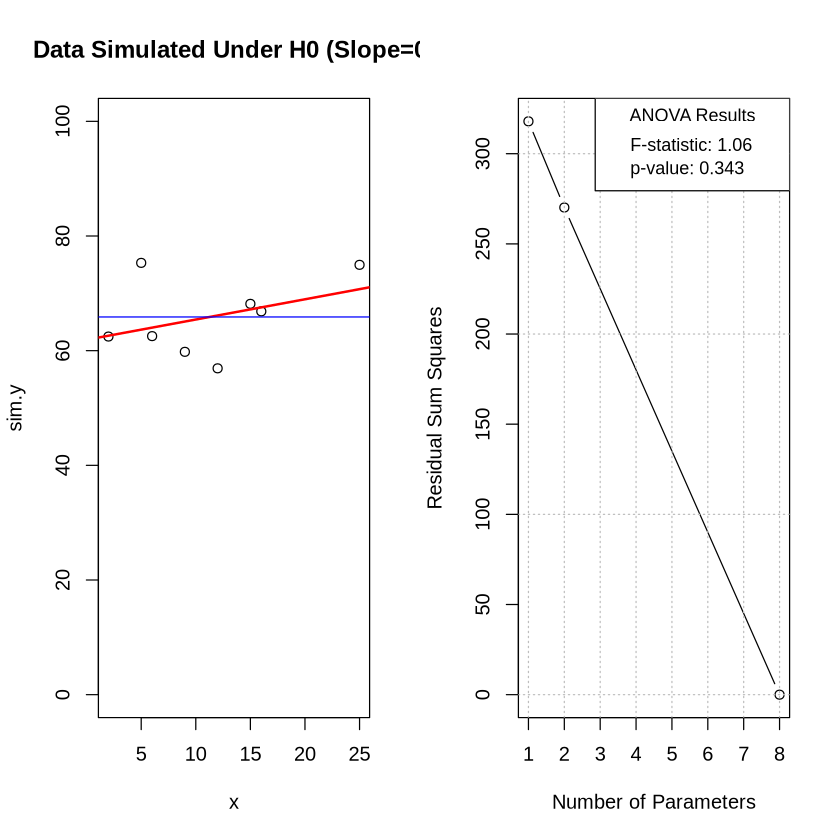

In [15]:
# Get parameters from the original fit to use in the simulation
# Get parameters from the original fit to use in the simulation
original_fit <- lm(y~x)
intercept_H0 <- coef(original_fit)[1] # beta_0
model_sigma <- sigma(original_fit)   # sigma

# Loop to generate frames for an animation
for (n.sim in 1:50) {
  # Simulate a dataset where H0 is true (slope = 0)
  sim.y <- intercept_H0 + rnorm(n, 0, model_sigma)
  
  # --- Plotting Section ---
  # Set up a 1x2 plot layout
  par(mfrow=c(1,2))
  
  # --- Left Plot: Scatterplot ---
  fit.sim.y <- lm(sim.y~x)
  plot(sim.y~x, ylim=c(0,100), main="Data Simulated Under H0 (Slope=0)") 
  abline(fit.sim.y,col="red", lwd=2)   # Fitted line for simulated data
  abline(h=mean(sim.y),col="blue") # Null model line
  
  # --- Right Plot: RSS Plot with ANOVA Info ---
  anova.fit.sim.y <- anova(fit.sim.y)
  ss.sim.y <- anova.fit.sim.y$`Sum Sq`
  rss.sim.y <- rev(cumsum(c(0, rev(ss.sim.y))))
  num.par <- cumsum(c(1,anova.fit.sim.y$Df))
  plot(rss.sim.y~num.par,xlab="Number of Parameters", ylab = "Residual Sum Squares", type ="b")
  abline(v=1:25, h=(0:50)*100,lty=3,col="grey")
  
  # --- NEW CODE: Add ANOVA table info to the right plot ---
  # 1. Extract the F-statistic and p-value
  f_value <- anova.fit.sim.y$"F value"[1]
  p_value <- anova.fit.sim.y$"Pr(>F)"[1]
  
  # 2. Format the text strings for display
  f_stat_text <- sprintf("F-statistic: %.2f", f_value)
  p_val_text  <- sprintf("p-value: %.3f", p_value)
  
  # 3. Use legend() to create an info box on the plot
  legend(
    "topright", # Position of the box
    legend = c(f_stat_text, p_val_text),
    title = "ANOVA Results",
    bty = "o", # Type of box ("o" for a full box, "n" for no box)
    cex = 0.9  # Character size
  )
}

### When the slope is non-zero ($H_1$ is true)

In [ ]:
# --- Assumed Setup Code (from your previous file) ---

# Get parameters from the original fit to use in the simulation
original_fit <- lm(y~x)
intercept_HA <- coef(original_fit)[1] # beta_0
model_sigma <- sigma(original_fit)   # sigma
slope_HA <- -2                       # A specified non-zero slope for the alternative hypothesis

# Loop to generate frames for an animation
for (n.sim in 1:50) {
  # Simulate a dataset where H0 is false (true slope = -2)
  mean_y <- intercept_HA + slope_HA * x
  sim.y <- mean_y + rnorm(n, 0, model_sigma)

  # --- Plotting Section ---
  # Set up a 1x2 plot layout
  par(mfrow=c(1,2))

  # --- Left Plot: Scatterplot ---
  fit.sim.y <- lm(sim.y~x)
  plot(sim.y~x, ylim=c(0,80), main="Data Simulated Under HA (Slope=-2)") 
  abline(fit.sim.y,col="red", lwd=2)   # Fitted line for simulated data
  abline(h=mean(sim.y),col="blue") # Null model line

  # --- Right Plot: RSS Plot with ANOVA Info ---
  anova.fit.sim.y <- anova(fit.sim.y)
  ss.sim.y <- anova.fit.sim.y$`Sum Sq`
  rss.sim.y <- rev(cumsum(c(0, rev(ss.sim.y))))
  num.par <- cumsum(c(1,anova.fit.sim.y$Df))
  plot(rss.sim.y~num.par,xlab="Number of Parameters", ylab = "Residual Sum Squares", type ="b")
  abline(v=1:25, h=(0:50)*100,lty=3,col="grey")
  
  # --- NEW CODE: Add ANOVA table info to the right plot ---
  # 1. Extract the F-statistic and p-value
  f_value <- anova.fit.sim.y$"F value"[1]
  p_value <- anova.fit.sim.y$"Pr(>F)"[1]
  
  # 2. Format the text strings for display
  f_stat_text <- sprintf("F-statistic: %.2f", f_value)
  # Use scientific notation for potentially very small p-values
  p_val_text  <- sprintf("p-value: %.3e", p_value) 
  
  # 3. Use legend() to create an info box on the plot
  legend(
    "topright", # Position of the box
    legend = c(f_stat_text, p_val_text),
    title = "ANOVA Results",
    bty = "o", # Type of box
    cex = 0.9  # Character size
  )
}

# Example 2: Oxygen Purity Data

This section performs a simple linear regression analysis on oxygen purity data. We will model the purity of oxygen (`y`) as a function of the hydrocarbon level (`x`).

***

## 1. Data Input

First, we define the `x` (Hydrocarbon Level) and `y` (Purity) variables and combine them into a data frame called `purity.data`.

In [ ]:
# Define the data vectors
x <- c(0.99, 1.02, 1.15, 1.29, 1.46, 1.36, 0.87, 1.23, 1.55, 1.40, 1.19, 
       1.15, 0.98, 1.01, 1.11, 1.20, 1.26, 1.32, 1.43, 0.95)
y <- c(90.01, 89.05, 91.43, 93.74, 96.73, 94.45, 87.59, 91.77, 99.42, 93.65, 
       93.54, 92.52, 90.56, 89.54, 89.85, 90.39, 93.25, 93.41, 94.98, 87.33)

# Get the number of observations
n <- length(x)
n

# Create a data frame
purity.data <- data.frame(x = x, y = y)
head(purity.data)

***

## 2. Model Fitting and Summary

We fit a linear model using the `lm()` function and then print the detailed summary of the model, which includes coefficients, R-squared, and other statistics.

In [ ]:
# Fit the model using the lm() function
fit <- lm(y ~ x, data = purity.data)

# Print the summary of the fit
summary(fit)

***

## 3. Visualization and Diagnostics

### Scatter Plot with Fitted Line

Here we visualize the relationship between hydrocarbon level and purity with the fitted regression line overlaid.

In [ ]:
# Create scatter diagram and add the fitted line
plot(purity.data$x, purity.data$y, 
     xlab = "Hydrocarbon level (x)", ylab = "Purity (y)",
     main = "Oxygen Purity vs. Hydrocarbon Level")
abline(fit, col = "red", lwd = 2)

### Confidence Intervals and ANOVA

We can compute the 95% confidence intervals for the regression coefficients and generate the ANOVA table for the model.

In [ ]:
# Confidence intervals of the regression coefficients
confint(fit, level = 0.95)

# ANOVA table
anova(fit)

***

## 4. Mean Response and Prediction Intervals

We will now calculate and visualize the confidence bands for the mean response and the prediction bands for new observations.

### Generating Bands

First, we create a sequence of `x` values to make predictions. Then, we use the `predict()` function to calculate the confidence and prediction intervals.

In [ ]:
# Create a new data frame with values of x for which we want to predict/estimate
x0 <- seq(min(purity.data$x), max(purity.data$x), length = 50)
newdata <- data.frame(x = x0)

# Confidence interval for the mean response
est.mean <- predict(fit, newdata = newdata, interval = "confidence", level = 0.95)

# Prediction interval for a new observation
pred.new <- predict(fit, newdata = newdata, interval = "prediction", level = 0.95)

### Plotting Bands

This plot shows the fitted regression line along with the 95% confidence bands (blue dashed lines) and 95% prediction bands (red dotted lines).

In [ ]:
# Plot the data and the fitted line
plot(purity.data$x, purity.data$y,
     xlab = "Hydrocarbon level (x)", ylab = "Purity (y)",
     main = "Regression Line with Confidence and Prediction Bands")
abline(fit)

# Add the confidence and prediction bands
matlines(x0, est.mean[, 2:3], col = "blue", lty = 2, lwd = 2)
matlines(x0, pred.new[, 2:3], col = "red", lty = 3, lwd = 2)

# Add a legend
legend("topleft", c("Confidence Bands", "Prediction Bands"),
       col = c("blue", "red"), lty = 2:3, bty = "n")

***

## 5. Residual Analysis

To check the model's assumptions, we analyze the residuals. We extract the standardized residuals and create a set of diagnostic plots.

In [ ]:
# Extract fitted values and residuals
pred <- fitted.values(fit)
e <- resid(fit)

# Compute standardized residuals
d <- e / summary(fit)$sigma

# Create a 2x2 layout for plots
par(mfrow = c(2, 2))

# 1. Scatter plot with regression line
plot(purity.data$x, purity.data$y, xlab = "x", ylab = "y")
abline(fit)

# 2. Normal Q-Q plot of standardized residuals
qqnorm(d, main = "Normal Q-Q Plot")
qqline(d)

# 3. Standardized residuals vs. Predicted values
plot(pred, d, xlab = "Predicted values", ylab = "Standardized residuals",
     main = "Residuals vs. Fits")
abline(h = 0, lty = 2)

# 4. Standardized residuals vs. Observation order
plot(1:n, d, xlab = "Observation Order", ylab = "Standardized residuals",
     main = "Residuals vs. Order")
abline(h = 0, lty = 2)

In [ ]:
# Reset plotting layout
par(mfrow = c(1, 1))

---

# Correlation Analysis

This section performs a correlation analysis between the strength and length of a certain material.

## 1. Data and Visualization

We define the `strength` and `length` data and create a scatter plot to visualize their relationship.

In [ ]:
# Define the data vectors
strength <- c(9.95, 24.45, 31.75, 35.00, 25.02, 16.86, 14.38, 9.60, 24.35,
              27.50, 17.08, 37.00, 41.95, 11.66, 21.65, 17.89, 69.00, 10.30, 
              34.93, 46.59, 44.88, 54.12, 56.63, 22.13, 21.15)
length <- c(2, 8, 11, 10, 8, 4, 2, 2, 9, 8, 4, 11, 12, 2, 4, 4, 20, 1, 10,
            15, 15, 16, 17, 6, 5)

# Plot the relationship
plot(length, strength, xlab = "Length", ylab = "Strength",
     main = "Strength vs. Length")

## 2. Correlation Test

We calculate the Pearson correlation coefficient and perform a formal hypothesis test for the correlation.

In [ ]:
# Calculate the correlation coefficient
cor(strength, length)

# Perform the correlation test
cor.test(strength, length)

The results show a strong positive correlation between length and strength, and the p-value is highly significant, indicating that this relationship is not due to random chance.